In [3]:
import pandas as pd

data = pd.read_csv(r"C:\Users\user\Downloads\country_vaccinations.csv.zip")

print(data.head())

       country iso_code        date  total_vaccinations  people_vaccinated  \
0  Afghanistan      AFG  2021-02-22                 0.0                0.0   
1  Afghanistan      AFG  2021-02-23                 NaN                NaN   
2  Afghanistan      AFG  2021-02-24                 NaN                NaN   
3  Afghanistan      AFG  2021-02-25                 NaN                NaN   
4  Afghanistan      AFG  2021-02-26                 NaN                NaN   

   people_fully_vaccinated  daily_vaccinations_raw  daily_vaccinations  \
0                      NaN                     NaN                 NaN   
1                      NaN                     NaN              1367.0   
2                      NaN                     NaN              1367.0   
3                      NaN                     NaN              1367.0   
4                      NaN                     NaN              1367.0   

   total_vaccinations_per_hundred  people_vaccinated_per_hundred  \
0                 

In [69]:
# Γενικές πληροφορίες για το DataFrame
print(data.info())

# Στατιστικά για τα αριθμητικά πεδία
print(data.describe())

# Εμφάνιση των πρώτων 5 γραμμών
print(data.head())

<class 'pandas.core.frame.DataFrame'>
Index: 14374 entries, 6 to 25861
Data columns (total 16 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              14374 non-null  object 
 1   iso_code                             14374 non-null  object 
 2   date                                 14374 non-null  object 
 3   total_vaccinations                   14374 non-null  float64
 4   people_vaccinated                    14374 non-null  float64
 5   people_fully_vaccinated              14374 non-null  float64
 6   daily_vaccinations_raw               14374 non-null  float64
 7   daily_vaccinations                   14374 non-null  float64
 8   total_vaccinations_per_hundred       14374 non-null  float64
 9   people_vaccinated_per_hundred        14374 non-null  float64
 10  people_fully_vaccinated_per_hundred  14374 non-null  float64
 11  daily_vaccinations_per_million   

In [13]:
print(data.columns)

Index(['country', 'iso_code', 'date', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated',
       'daily_vaccinations_raw', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website'],
      dtype='object')


In [15]:
print(data.head())

       country iso_code        date  total_vaccinations  people_vaccinated  \
0  Afghanistan      AFG  2021-02-22                 0.0                0.0   
1  Afghanistan      AFG  2021-02-23                 0.0                0.0   
2  Afghanistan      AFG  2021-02-24                 0.0                0.0   
3  Afghanistan      AFG  2021-02-25                 0.0                0.0   
4  Afghanistan      AFG  2021-02-26                 0.0                0.0   

   people_fully_vaccinated  daily_vaccinations_raw  daily_vaccinations  \
0                      0.0                     0.0                 0.0   
1                      0.0                     0.0              1367.0   
2                      0.0                     0.0              1367.0   
3                      0.0                     0.0              1367.0   
4                      0.0                     0.0              1367.0   

   total_vaccinations_per_hundred  people_vaccinated_per_hundred  \
0                 

In [17]:
data.columns = data.columns.str.strip()  # Removes any extra spaces

In [23]:
# Assuming you want to group by 'country' and calculate the mean of 'people_vaccinated_per_hundred'
country_stats = data.groupby('country')['people_vaccinated_per_hundred'].mean()

print(country_stats)

country
Afghanistan           0.117965
Albania               3.111049
Algeria               0.045504
Andorra               2.286596
Angola                0.215179
                       ...    
Wales                40.890473
Wallis and Futuna     5.337176
Yemen                 0.080000
Zambia                0.223175
Zimbabwe              2.203821
Name: people_vaccinated_per_hundred, Length: 217, dtype: float64


In [25]:
print(data.columns)  # to see the available columns

Index(['country', 'iso_code', 'date', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated',
       'daily_vaccinations_raw', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website'],
      dtype='object')


In [29]:
# Grouping by 'country' and calculating the mean of the vaccination percentage
country_stats = data.groupby('country')['people_vaccinated_per_hundred'].mean()

# Displaying the results
print(country_stats)

country
Afghanistan           0.117965
Albania               3.111049
Algeria               0.045504
Andorra               2.286596
Angola                0.215179
                       ...    
Wales                40.890473
Wallis and Futuna     5.337176
Yemen                 0.080000
Zambia                0.223175
Zimbabwe              2.203821
Name: people_vaccinated_per_hundred, Length: 217, dtype: float64


In [39]:
# Calculating the vaccination rate based on the number of people vaccinated and total population
data['vaccination_rate'] = (data['people_vaccinated'] / data['total_vaccinations']) * 100

# Now you can group by country and calculate the mean vaccination rate
country_stats = data.groupby('country')['vaccination_rate'].mean()

# Displaying the result
print(country_stats)

country
Afghanistan           85.845058
Albania               34.028929
Algeria              100.000000
Andorra               66.487725
Angola                86.627558
                        ...    
Wales                 80.182096
Wallis and Futuna     75.613443
Yemen                100.000000
Zambia                99.006029
Zimbabwe              82.728924
Name: vaccination_rate, Length: 217, dtype: float64


In [37]:
# Check for NaN values
print(data['vaccination_rate'].isna().sum())  # Prints the number of NaN values

# Check for infinite values
print((data['vaccination_rate'] == float('inf')).sum())  # Prints the number of infinite values

11350
138


In [41]:
# Remove rows where vaccination_rate is NaN or infinite
data = data[~data['vaccination_rate'].isin([float('inf'), float('-inf')])]
data = data.dropna(subset=['vaccination_rate'])

In [45]:
data['vaccination_rate'].fillna(0, inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_20280\3084946371.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['vaccination_rate'].fillna(0, inplace=True)


In [47]:
data['vaccination_rate'] = data['vaccination_rate'].fillna(0)

In [49]:
# Replace NaN values with 0 in 'vaccination_rate' column
data['vaccination_rate'] = data['vaccination_rate'].fillna(0)

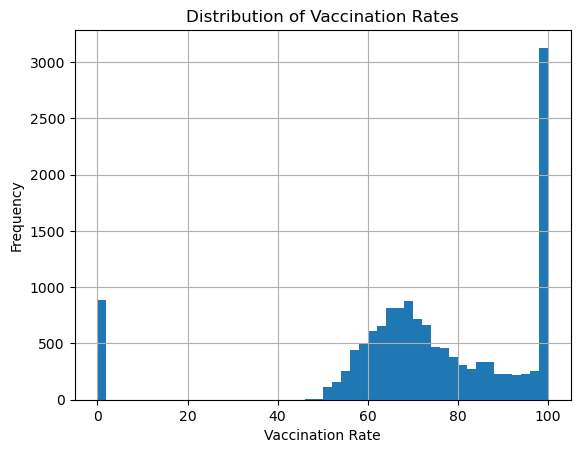

In [51]:
data['vaccination_rate'].hist(bins=50)
plt.title('Distribution of Vaccination Rates')
plt.xlabel('Vaccination Rate')
plt.ylabel('Frequency')
plt.show()

In [53]:
print(data['vaccination_rate'].describe())

count    14374.000000
mean        73.507165
std         24.049216
min          0.000000
25%         63.908131
50%         73.001290
75%         94.137605
max        100.000000
Name: vaccination_rate, dtype: float64


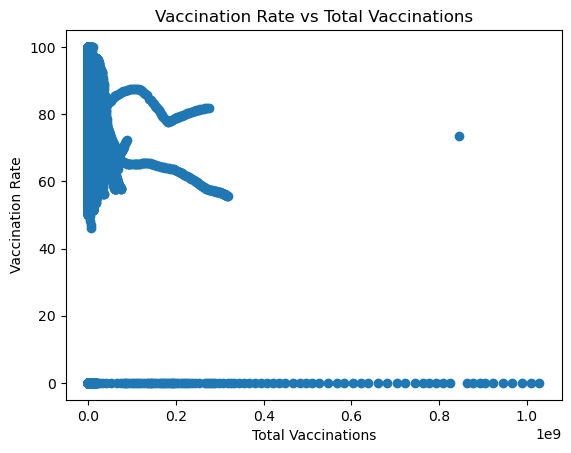

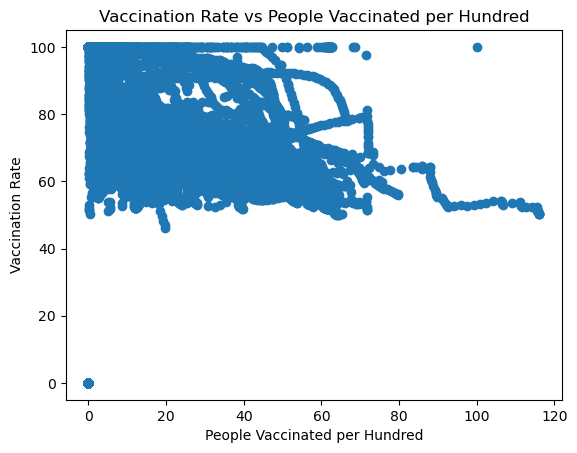

In [63]:
# Scatter plot between total vaccinations and vaccination rate
plt.scatter(data['total_vaccinations'], data['vaccination_rate'])
plt.title('Vaccination Rate vs Total Vaccinations')
plt.xlabel('Total Vaccinations')
plt.ylabel('Vaccination Rate')
plt.show()

# Scatter plot between people vaccinated per hundred and vaccination rate
plt.scatter(data['people_vaccinated_per_hundred'], data['vaccination_rate'])
plt.title('Vaccination Rate vs People Vaccinated per Hundred')
plt.xlabel('People Vaccinated per Hundred')
plt.ylabel('Vaccination Rate')
plt.show()

In [67]:
# Calculate the correlation between vaccination rate and total vaccinations
correlation = data['vaccination_rate'].corr(data['total_vaccinations'])
print(f'Correlation between vaccination rate and total vaccinations: {correlation}')

Correlation between vaccination rate and total vaccinations: -0.20386536051718232


In [71]:

top_countries = data.groupby('country')['vaccination_rate'].mean().nlargest(10)
print(top_countries)

country
Algeria          100.0
Bhutan           100.0
Botswana         100.0
Burkina Faso     100.0
Chad             100.0
Cote d'Ivoire    100.0
Eswatini         100.0
Guinea-Bissau    100.0
Libya            100.0
Madagascar       100.0
Name: vaccination_rate, dtype: float64


In [73]:
# Calculate the correlation between vaccination rate and total vaccinations
correlation = data['vaccination_rate'].corr(data['total_vaccinations'])
print(f'Correlation between vaccination rate and total vaccinations: {correlation}')

Correlation between vaccination rate and total vaccinations: -0.20386536051718232


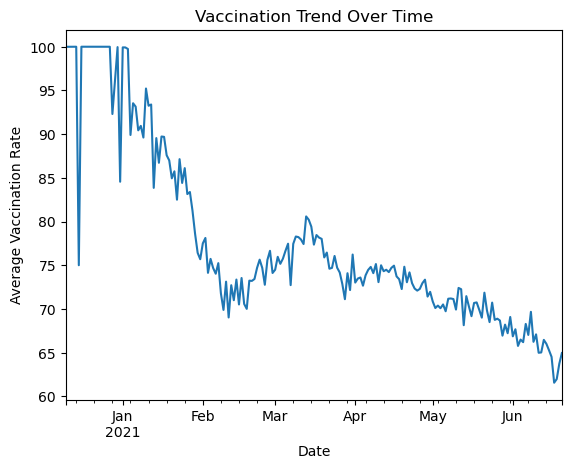

In [75]:
data['date'] = pd.to_datetime(data['date']) 
trend = data.groupby('date')['vaccination_rate'].mean()

trend.plot(title="Vaccination Trend Over Time")
plt.xlabel("Date")
plt.ylabel("Average Vaccination Rate")
plt.show()

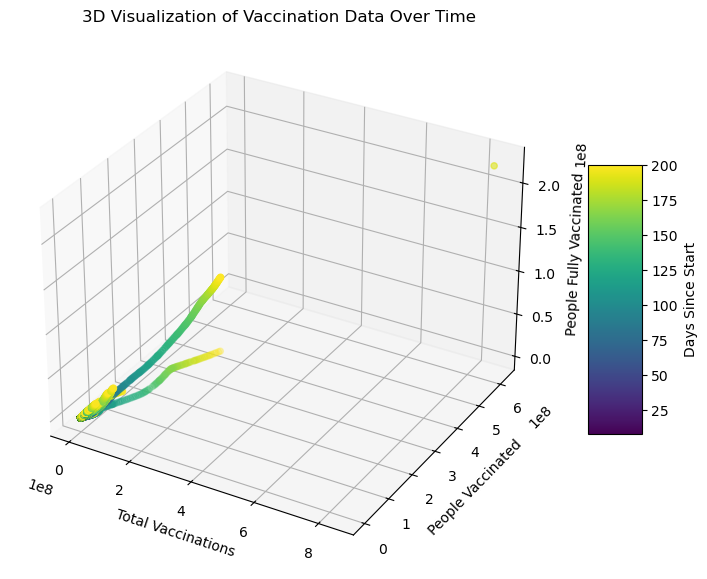

In [89]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming you have already loaded your data
data = pd.read_csv(r"C:\Users\user\Downloads\country_vaccinations.csv.zip")

# Convert 'date' to datetime format
data['date'] = pd.to_datetime(data['date'])

# Create a new column 'days_since_start' which is the number of days since the earliest date
data['days_since_start'] = (data['date'] - data['date'].min()).dt.days

# Check for missing values in the important columns and drop them
data = data.dropna(subset=['total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated'])

# Set up the 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create the scatter plot with 'total_vaccinations', 'people_vaccinated', and 'people_fully_vaccinated'
# Use 'days_since_start' for the color argument (c)
scatter = ax.scatter(data['total_vaccinations'], data['people_vaccinated'], data['people_fully_vaccinated'], c=data['days_since_start'], cmap='viridis')

# Set labels
ax.set_xlabel('Total Vaccinations')
ax.set_ylabel('People Vaccinated')
ax.set_zlabel('People Fully Vaccinated')

# Add a color bar for the 'days_since_start' column
cbar = plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5)
cbar.set_label('Days Since Start')

# Set the title
ax.set_title('3D Visualization of Vaccination Data Over Time')

# Show the plot
plt.show()

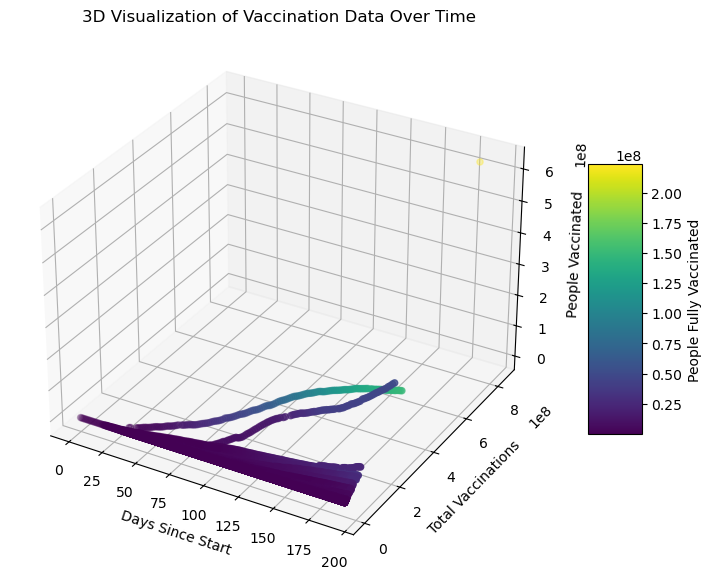

In [91]:
# Convert date to a datetime object
data['date'] = pd.to_datetime(data['date'])

# Create a new column 'days_since_start' which is the number of days since the earliest date
data['days_since_start'] = (data['date'] - data['date'].min()).dt.days

# Now plot with the date (days since start) as one of the axes
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(data['days_since_start'], data['total_vaccinations'], data['people_vaccinated'], c=data['people_fully_vaccinated'], cmap='viridis')

ax.set_xlabel('Days Since Start')
ax.set_ylabel('Total Vaccinations')
ax.set_zlabel('People Vaccinated')

# Color bar for 'people_fully_vaccinated'
cbar = plt.colorbar(ax.collections[0], ax=ax, shrink=0.5, aspect=5)
cbar.set_label('People Fully Vaccinated')

ax.set_title('3D Visualization of Vaccination Data Over Time')

plt.show()

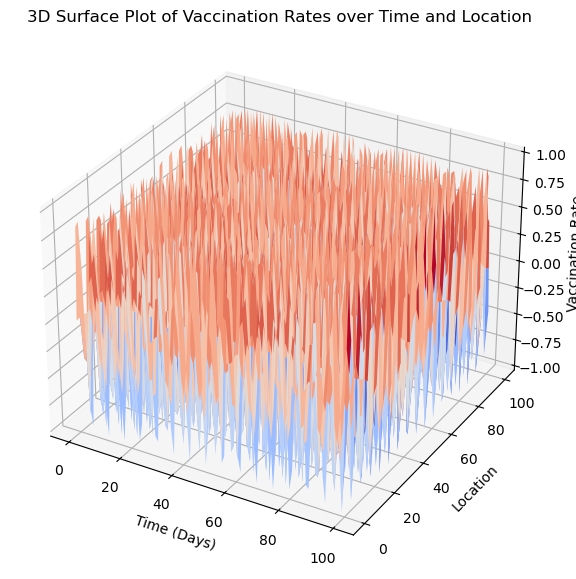

In [95]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd

# Load data
data = pd.read_csv(r"C:\Users\user\Downloads\country_vaccinations.csv.zip")

# Create some synthetic data for illustration
# Replace this with actual data for time vs vaccination rate
time = np.linspace(0, 100, 100)  # Example time from 0 to 100 days
location = np.linspace(0, 100, 100)  # Example locations
time, location = np.meshgrid(time, location)
vaccination_rate = np.sin(time) * np.cos(location)  # Example function for vaccination rate

# Create a 3D surface plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(time, location, vaccination_rate, cmap='coolwarm')

ax.set_xlabel('Time (Days)')
ax.set_ylabel('Location')
ax.set_zlabel('Vaccination Rate')
plt.title('3D Surface Plot of Vaccination Rates over Time and Location')
plt.show()

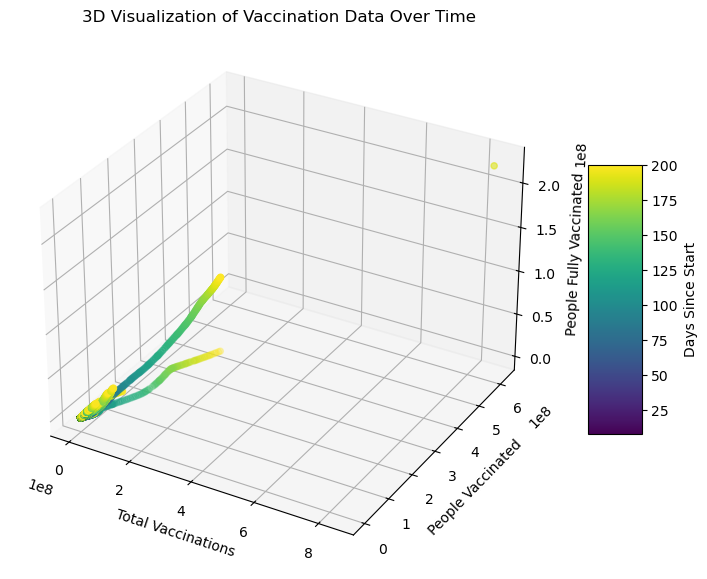

In [99]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming you have already loaded your data
data = pd.read_csv(r"C:\Users\user\Downloads\country_vaccinations.csv.zip")

# Convert 'date' to datetime format
data['date'] = pd.to_datetime(data['date'])

# Create a new column 'days_since_start' which is the number of days since the earliest date
data['days_since_start'] = (data['date'] - data['date'].min()).dt.days

# Check for missing values in the important columns and drop them
data = data.dropna(subset=['total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated'])

# Set up the 3D plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Create the scatter plot with 'total_vaccinations', 'people_vaccinated', and 'people_fully_vaccinated'
# Use 'days_since_start' for the color argument (c)
scatter = ax.scatter(data['total_vaccinations'], data['people_vaccinated'], data['people_fully_vaccinated'], c=data['days_since_start'], cmap='viridis')

# Set labels
ax.set_xlabel('Total Vaccinations')
ax.set_ylabel('People Vaccinated')
ax.set_zlabel('People Fully Vaccinated')

# Add a color bar for the 'days_since_start' column
cbar = plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5)
cbar.set_label('Days Since Start')

# Set the title
ax.set_title('3D Visualization of Vaccination Data Over Time')

# Show the plot
plt.show()

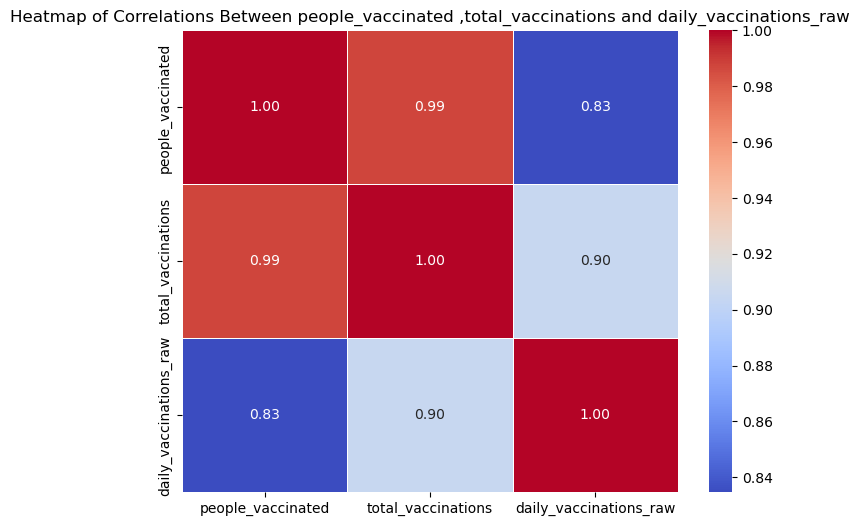

In [101]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Load your data
data = pd.read_csv(r"C:\Users\user\Downloads\country_vaccinations.csv.zip")

# Calculate correlation matrix
corr_matrix = data[['people_vaccinated', 'total_vaccinations', 'daily_vaccinations_raw']].corr()

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap of Correlations Between people_vaccinated ,total_vaccinations and daily_vaccinations_raw')
plt.show()

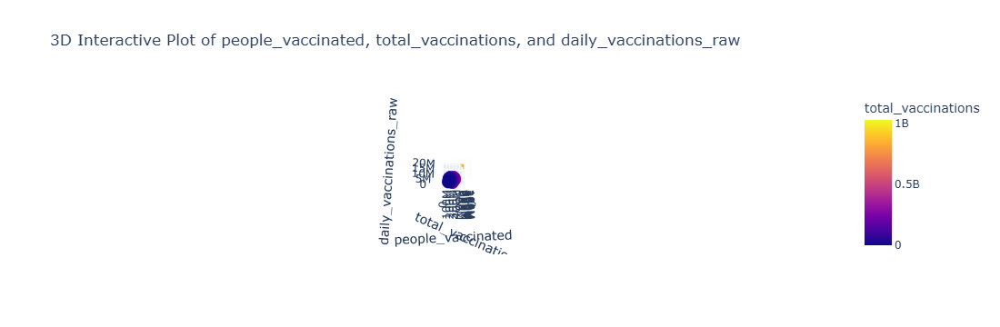

In [103]:
import plotly.express as px
import pandas as pd

# Load your data
data = pd.read_csv(r"C:\Users\user\Downloads\country_vaccinations.csv.zip")

# Create an interactive 3D scatter plot
fig = px.scatter_3d(data, x='people_vaccinated', y='total_vaccinations', z='daily_vaccinations_raw', 
                    color='total_vaccinations', title="3D Interactive Plot of people_vaccinated, total_vaccinations, and daily_vaccinations_raw" )

# Show the plottotal_vaccinations
fig.show()

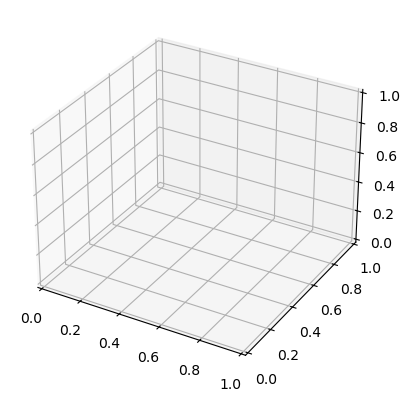

In [105]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
import pandas as pd

# Load your data
data = pd.read_csv(r"C:\Users\user\Downloads\country_vaccinations.csv.zip")

# Set up figure and 3D axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Create empty plot initially
x_data, y_data, z_data = [], [], []
scat = ax.scatter([], [], [])

def update(frame):
    # Get the data for the current frame (assuming you have time data in 'date')
    current_data = data[data['date'] == data['date'].unique()[frame]]
    x_data = current_data['people_vaccinated']
    y_data = current_data['total_vaccinations']
    z_data = current_data['daily_vaccinations_raw']
    
    scat._offsets3d = (x_data, y_data, z_data)
    return scat,

ani = FuncAnimation(fig, update, frames=len(data['date'].unique()), blit=True)
plt.show()

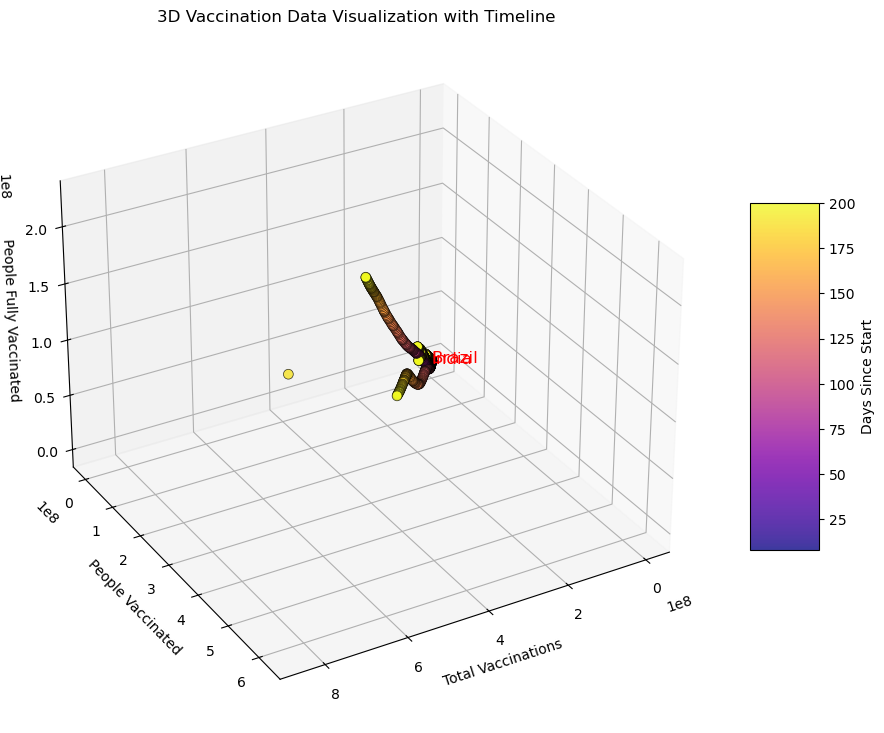

In [107]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Load your dataset
data = pd.read_csv(r"C:\Users\user\Downloads\country_vaccinations.csv.zip")

# Convert 'date' to datetime format
data['date'] = pd.to_datetime(data['date'])

# Create a new column 'days_since_start' which is the number of days since the earliest date
data['days_since_start'] = (data['date'] - data['date'].min()).dt.days

# Drop rows with missing values in important columns
data = data.dropna(subset=['total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated'])

# Set up the 3D plot
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Set up the color map
norm = plt.Normalize(vmin=data['days_since_start'].min(), vmax=data['days_since_start'].max())
cmap = plt.cm.plasma  # Change colormap to plasma (or use 'viridis', 'inferno', etc.)

# Create the scatter plot with 'total_vaccinations', 'people_vaccinated', and 'people_fully_vaccinated'
scatter = ax.scatter(data['total_vaccinations'], data['people_vaccinated'], data['people_fully_vaccinated'], 
                     c=data['days_since_start'], cmap=cmap, alpha=0.8, s=50, edgecolor='k', linewidth=0.5)

# Set labels
ax.set_xlabel('Total Vaccinations')
ax.set_ylabel('People Vaccinated')
ax.set_zlabel('People Fully Vaccinated')

# Add a color bar for 'days_since_start'
cbar = plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5)
cbar.set_label('Days Since Start')

# Title and gridlines
ax.set_title('3D Vaccination Data Visualization with Timeline')
ax.grid(True)

# Optionally add some annotations (for example, highlight top countries or specific data points)
highlight = ['USA', 'India', 'Brazil']
for country in highlight:
    country_data = data[data['country'] == country]
    if not country_data.empty:
        ax.text(country_data['total_vaccinations'].values[0], 
                country_data['people_vaccinated'].values[0], 
                country_data['people_fully_vaccinated'].values[0],
                country, color='red', fontsize=12)

# Rotate the view for a more dynamic visualization (optional)
ax.view_init(elev=30, azim=60)  # Adjust elevation and azimuthal angle

# Show the plot
plt.show()

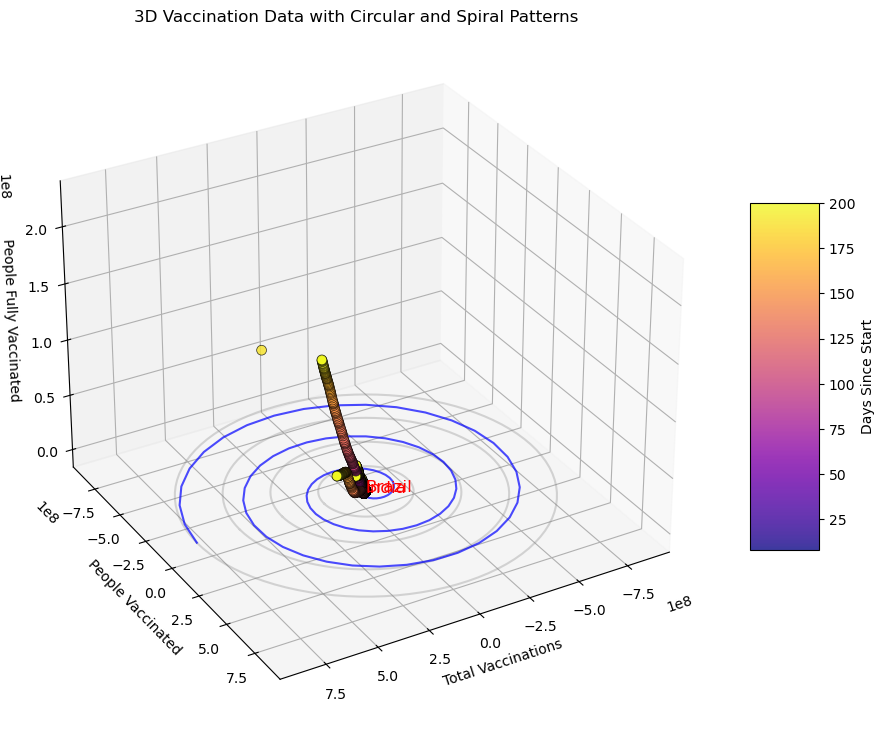

In [111]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Load your dataset
data = pd.read_csv(r"C:\Users\user\Downloads\country_vaccinations.csv.zip")

# Convert 'date' to datetime format
data['date'] = pd.to_datetime(data['date'])

# Create a new column 'days_since_start' which is the number of days since the earliest date
data['days_since_start'] = (data['date'] - data['date'].min()).dt.days

# Drop rows with missing values in important columns
data = data.dropna(subset=['total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated'])

# Set up the 3D plot
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Create the scatter plot with 'total_vaccinations', 'people_vaccinated', and 'people_fully_vaccinated'
scatter = ax.scatter(data['total_vaccinations'], data['people_vaccinated'], data['people_fully_vaccinated'], 
                     c=data['days_since_start'], cmap='plasma', alpha=0.8, s=50, edgecolor='k', linewidth=0.5)

# Set labels
ax.set_xlabel('Total Vaccinations')
ax.set_ylabel('People Vaccinated')
ax.set_zlabel('People Fully Vaccinated')

# Add a color bar for 'days_since_start'
cbar = plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5)
cbar.set_label('Days Since Start')

# Title and gridlines
ax.set_title('3D Vaccination Data with Circular and Spiral Patterns')

# Add circular gridlines
theta = np.linspace(0, 2 * np.pi, 100)
radii = np.linspace(0, max(data['total_vaccinations']), 5)

for r in radii:
    ax.plot(r * np.cos(theta), r * np.sin(theta), zs=0, zdir='z', alpha=0.3, color='gray')

# Add spiral pattern
spiral_theta = np.linspace(0, 6 * np.pi, 100)
spiral_radii = np.linspace(0, max(data['total_vaccinations']), 100)
ax.plot(spiral_radii * np.cos(spiral_theta), spiral_radii * np.sin(spiral_theta), zs=0, zdir='z', alpha=0.7, color='blue')

# Optionally add some annotations (for example, highlight top countries or specific data points)
highlight = ['USA', 'India', 'Brazil']
for country in highlight:
    country_data = data[data['country'] == country]
    if not country_data.empty:
        ax.text(country_data['total_vaccinations'].values[0], 
                country_data['people_vaccinated'].values[0], 
                country_data['people_fully_vaccinated'].values[0],
                country, color='red', fontsize=12)

# Rotate the view for a more dynamic visualization
ax.view_init(elev=30, azim=60)  # Adjust elevation and azimuthal angle

# Show the plot
plt.show()

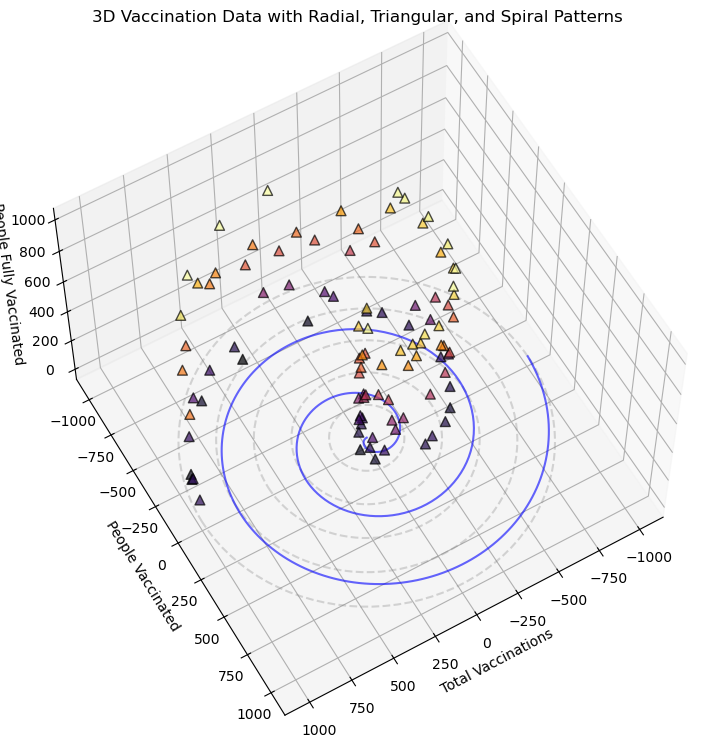

In [113]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Generating data for visualization
n = 100  # Number of data points
angles = np.linspace(0, 2 * np.pi, n)  # Angles for circle and spiral
radii = np.linspace(0, 1000, n)  # Radial distance for spiral
z = np.random.rand(n) * 1000  # Z-values for 3D effect

# Set up the 3D plot
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Plot the data as a radial scatter plot
x = radii * np.cos(angles)
y = radii * np.sin(angles)

# Scatter plot with triangular markers
ax.scatter(x, y, z, c=z, cmap='inferno', s=50, marker='^', alpha=0.7, edgecolors='black')

# Add concentric circular gridlines (circle every 200 units)
circle_radii = np.arange(200, 1001, 200)
for r in circle_radii:
    ax.plot(r * np.cos(angles), r * np.sin(angles), zs=[0]*n, zdir='z', alpha=0.3, color='gray', linestyle='--')

# Add a spiral pattern
spiral_radii = np.linspace(0, 1000, 500)
spiral_theta = np.linspace(0, 5 * np.pi, 500)
ax.plot(spiral_radii * np.cos(spiral_theta), spiral_radii * np.sin(spiral_theta), zs=[0]*500, zdir='z', alpha=0.6, color='blue')

# Title and labels
ax.set_title('3D Vaccination Data with Radial, Triangular, and Spiral Patterns')
ax.set_xlabel('Total Vaccinations')
ax.set_ylabel('People Vaccinated')
ax.set_zlabel('People Fully Vaccinated')

# Set view angle for better perspective
ax.view_init(elev=60, azim=60)

# Show the plot
plt.show()

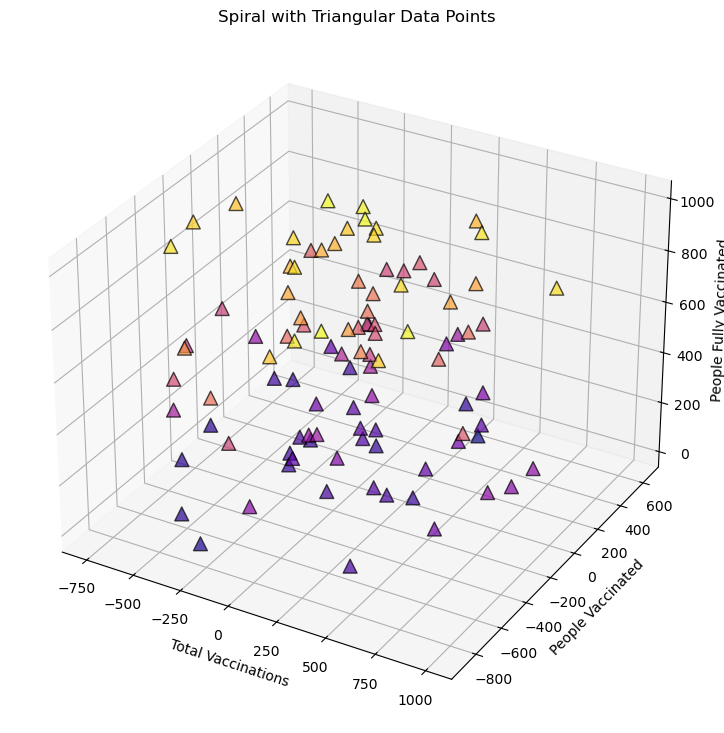

In [115]:
import numpy as np
import matplotlib.pyplot as plt

# Data generation
n = 100
angles = np.linspace(0, 4 * np.pi, n)  # Spiral turns
radii = np.linspace(0, 1000, n)  # Radial distance for spiral
z = np.random.rand(n) * 1000  # Z-values for 3D effect

# Convert polar coordinates to Cartesian
x = radii * np.cos(angles)
y = radii * np.sin(angles)

# Plotting
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Spiral scatter plot with triangular markers
ax.scatter(x, y, z, c=z, cmap='plasma', s=100, marker='^', alpha=0.7, edgecolors='black')

# Title and labels
ax.set_title('Spiral with Triangular Data Points')
ax.set_xlabel('Total Vaccinations')
ax.set_ylabel('People Vaccinated')
ax.set_zlabel('People Fully Vaccinated')

# Show plot
plt.show()

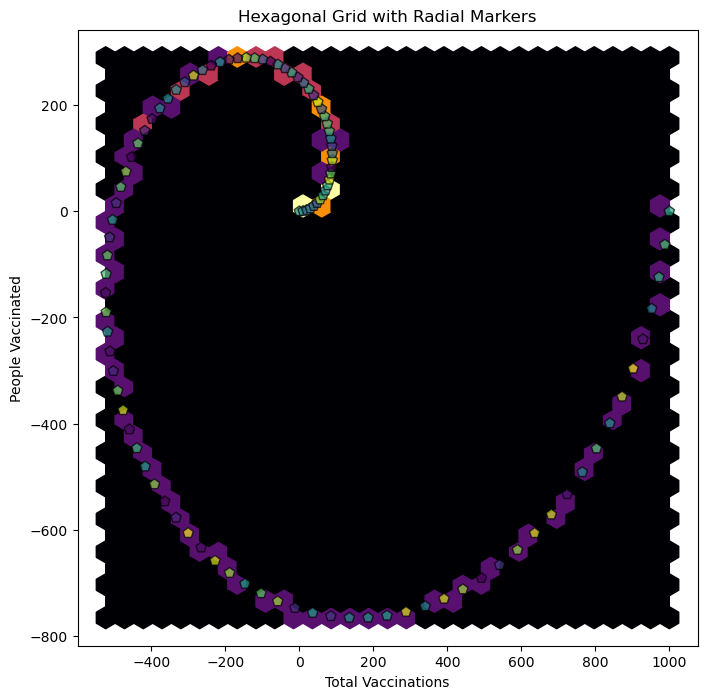

In [117]:
import numpy as np
import matplotlib.pyplot as plt

# Data generation for hexagonal grid
n = 100
angles = np.linspace(0, 2 * np.pi, n)
radii = np.linspace(0, 1000, n)
x = radii * np.cos(angles)
y = radii * np.sin(angles)
z = np.random.rand(n) * 1000  # Z values for height or another measure

# Plotting
fig, ax = plt.subplots(figsize=(8, 8))

# Create hexagonal grid
ax.hexbin(x, y, gridsize=30, cmap='inferno')

# Scatter plot over hexagonal grid with markers
ax.scatter(x, y, c=z, cmap='viridis', s=60, marker='p', alpha=0.7, edgecolors='black')

ax.set_title('Hexagonal Grid with Radial Markers')
ax.set_xlabel('Total Vaccinations')
ax.set_ylabel('People Vaccinated')

plt.show()

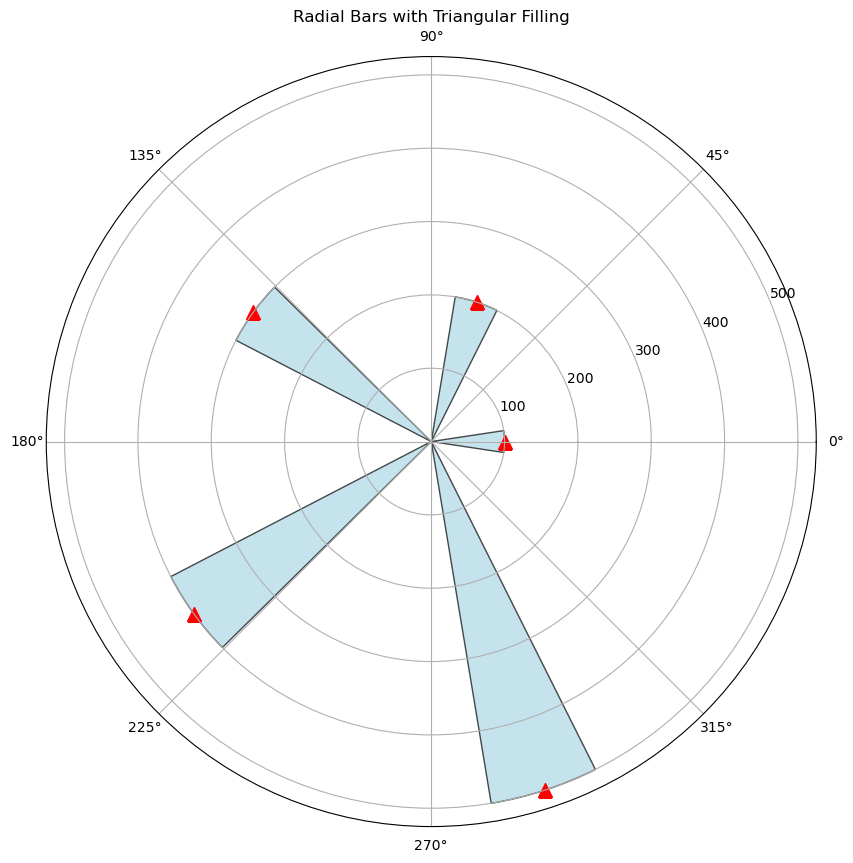

In [119]:
import numpy as np
import matplotlib.pyplot as plt

# Data for radial bars
categories = ['A', 'B', 'C', 'D', 'E']
values = [100, 200, 300, 400, 500]
angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False)

# Plotting
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='polar')

# Create bars
bars = ax.bar(angles, values, width=0.3, color='lightblue', edgecolor='black', alpha=0.7)

# Add triangular markers inside each bar
for i, bar in enumerate(bars):
    angle = bar.get_x() + bar.get_width() / 2  # Center of each bar
    ax.scatter(angle, bar.get_height(), c='red', marker='^', s=100)  # Triangular marker

ax.set_title('Radial Bars with Triangular Filling')
plt.show()


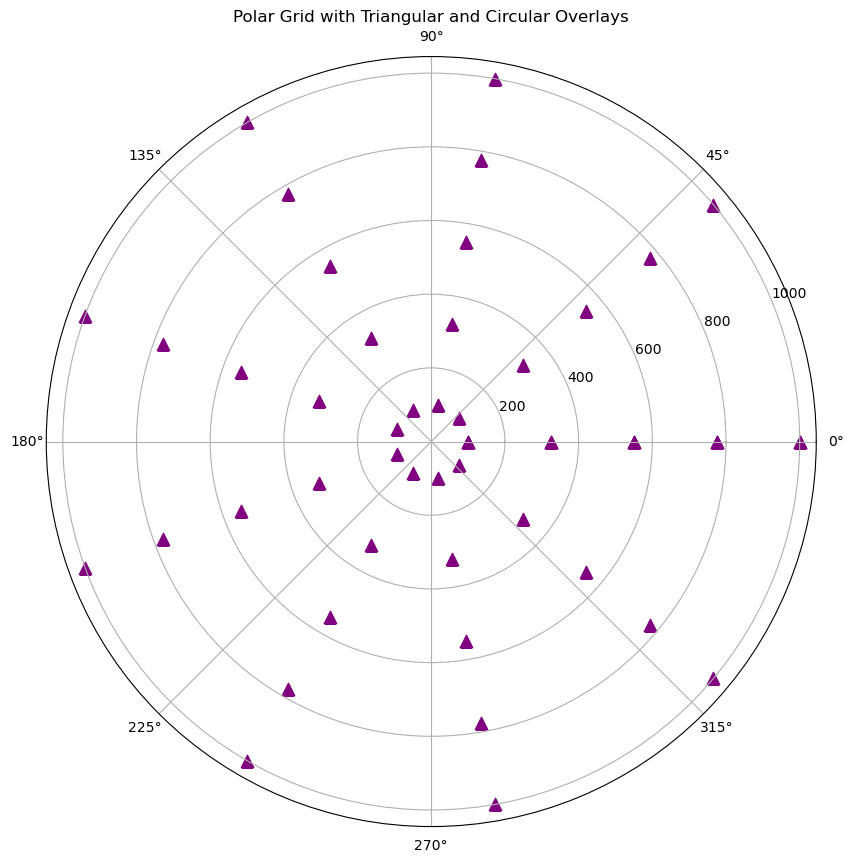

In [123]:
import numpy as np
import matplotlib.pyplot as plt

# Data for polar grid
n = 50
angles = np.linspace(0, 2 * np.pi, n)
radii = np.linspace(0, 1000, n)
x = radii * np.cos(angles)
y = radii * np.sin(angles)
z = np.random.rand(n) * 1000

# Plotting
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='polar')

# Create radial gridlines (concentric circles)
for r in np.linspace(100, 1000, 5):
    ax.plot([0, 2 * np.pi], [r, r], color='gray', linestyle='--')

# Add triangular markers at different radial distances
for r in np.linspace(100, 1000, 5):
    for angle in np.linspace(0, 2 * np.pi, 10):
        ax.scatter(angle, r, c='purple', marker='^', s=80)

ax.set_title('Polar Grid with Triangular and Circular Overlays')
plt.show()

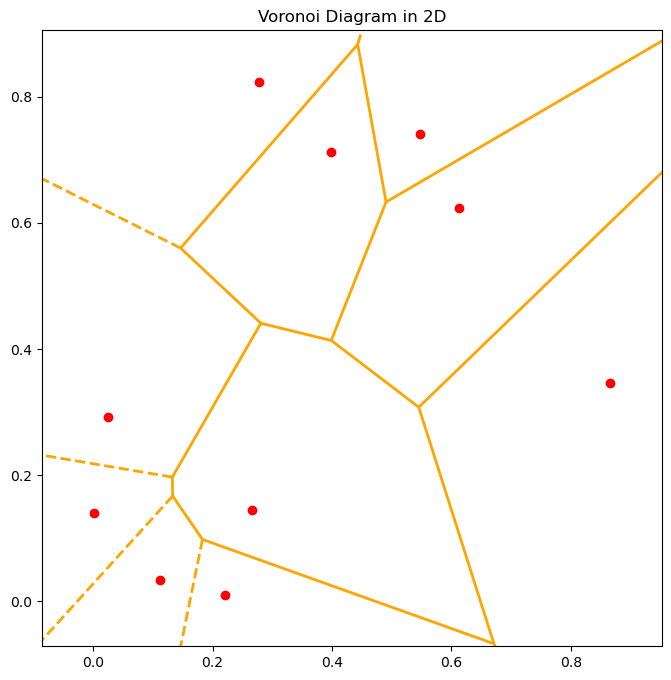

In [129]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Voronoi, voronoi_plot_2d

# Generate random points for Voronoi
points = np.random.rand(10, 2)  # 10 points in 2D

# Create Voronoi diagram
vor = Voronoi(points)

# Plot the Voronoi diagram
fig, ax = plt.subplots(figsize=(8, 8))
voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='orange', line_width=2)

# Plot the points
ax.scatter(points[:, 0], points[:, 1], color='red', zorder=5)
ax.set_title('Voronoi Diagram in 2D')
plt.show()

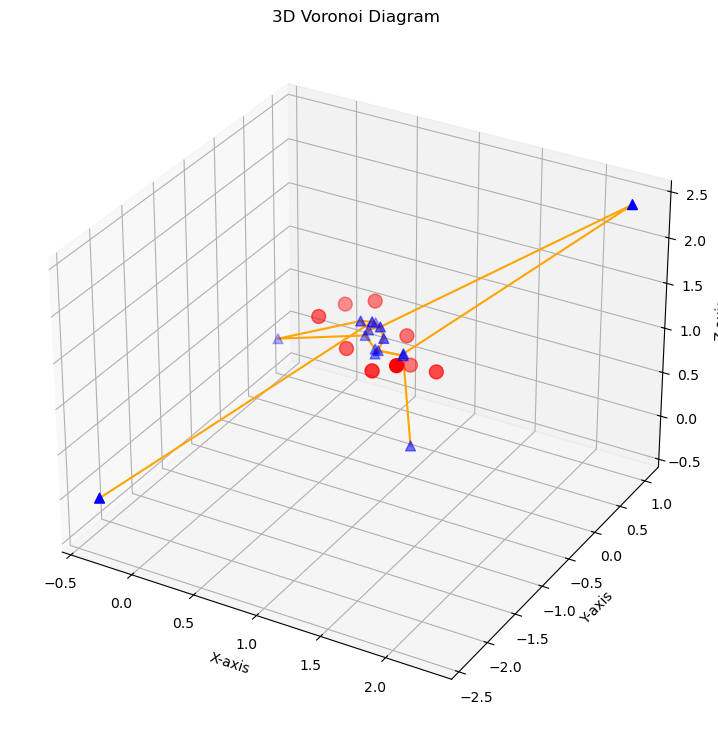

In [131]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import Voronoi
from mpl_toolkits.mplot3d import Axes3D

# Generate random points for Voronoi in 3D
points = np.random.rand(10, 3)

# Create Voronoi diagram
vor = Voronoi(points)

# Create a 3D plot
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Plot the points
ax.scatter(points[:, 0], points[:, 1], points[:, 2], color='red', s=100, marker='o')

# Plot the Voronoi vertices
ax.scatter(vor.vertices[:, 0], vor.vertices[:, 1], vor.vertices[:, 2], color='blue', s=50, marker='^')

# Draw edges (simplified version)
for simplex in vor.ridge_vertices:
    simplex = np.array(simplex)
    if -1 not in simplex:  # Exclude infinite ridges
        ax.plot(vor.vertices[simplex, 0], vor.vertices[simplex, 1], vor.vertices[simplex, 2], color='orange')

# Set titles and labels
ax.set_title('3D Voronoi Diagram')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')

plt.show()

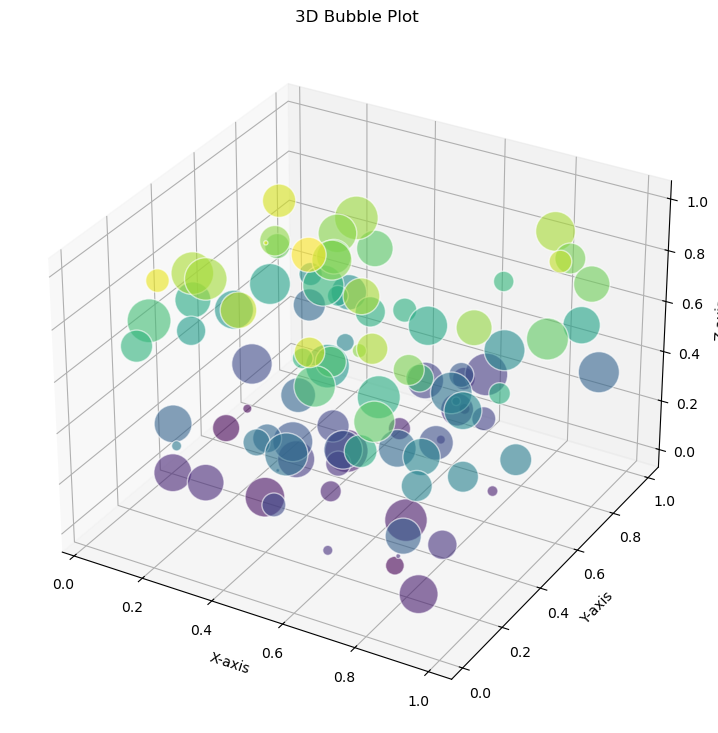

In [133]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Generate random data
x = np.random.rand(100)
y = np.random.rand(100)
z = np.random.rand(100)
sizes = np.random.rand(100) * 1000  # Bubble size

# Create 3D scatter plot
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(x, y, z, s=sizes, c=z, cmap='viridis', alpha=0.6, edgecolors='w', marker='o')

# Labels and title
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
ax.set_title('3D Bubble Plot')

plt.show()

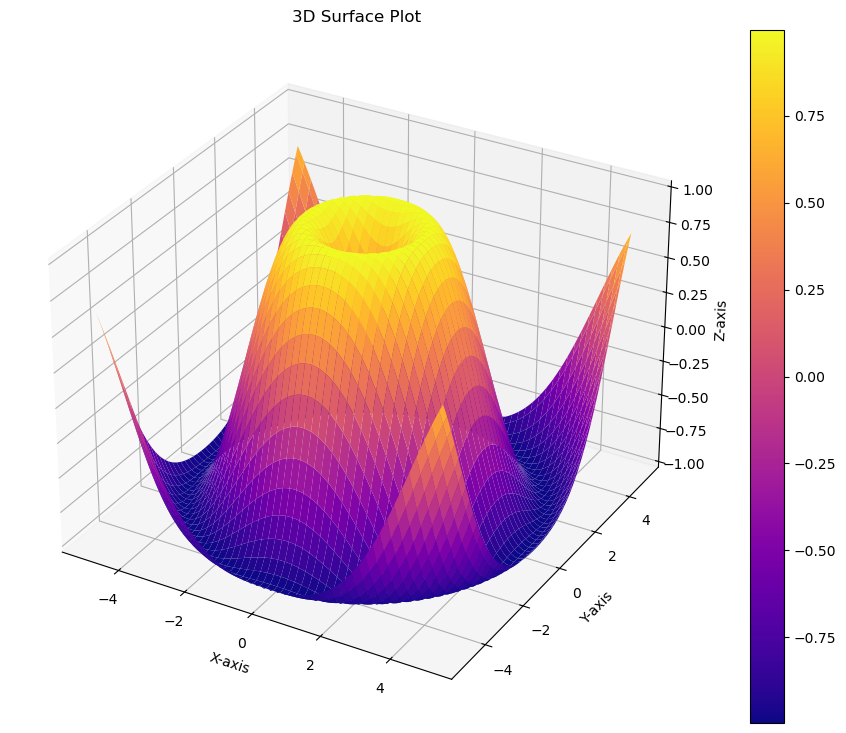

In [135]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Generate data for surface plot
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
x, y = np.meshgrid(x, y)
z = np.sin(np.sqrt(x**2 + y**2))

# Create 3D surface plot
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(x, y, z, cmap='plasma', edgecolor='none')

# Labels and title
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
ax.set_title('3D Surface Plot')

# Add color bar
fig.colorbar(surf)

plt.show()

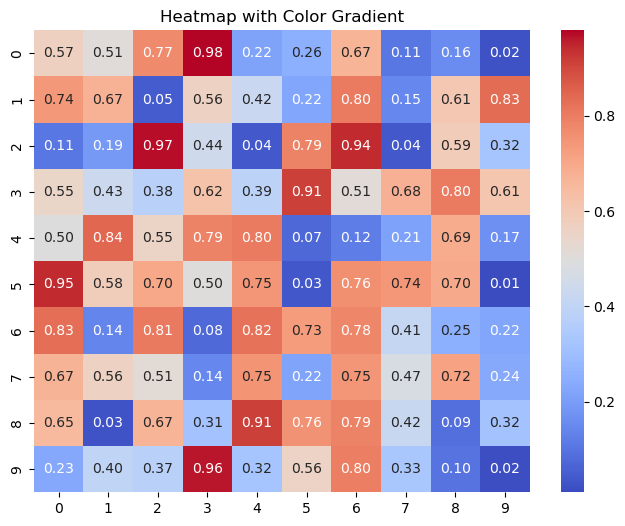

In [137]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Generate random data
data = np.random.rand(10, 10)

# Create heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(data, annot=True, cmap='coolwarm', fmt='.2f', cbar=True)

plt.title('Heatmap with Color Gradient')
plt.show()

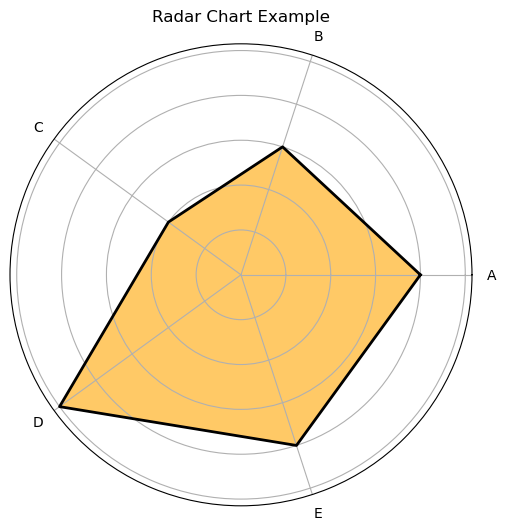

In [139]:
import numpy as np
import matplotlib.pyplot as plt

# Define data
labels = ['A', 'B', 'C', 'D', 'E']
values = [4, 3, 2, 5, 4]

# Number of variables
num_vars = len(labels)

# Compute angle for each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# Repeat the first value to close the circle
values += values[:1]
angles += angles[:1]

# Create the plot
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.fill(angles, values, color='orange', alpha=0.6)
ax.plot(angles, values, color='black', linewidth=2)

# Add labels
ax.set_yticklabels([])  # Remove radial labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)

plt.title('Radar Chart Example')
plt.show()

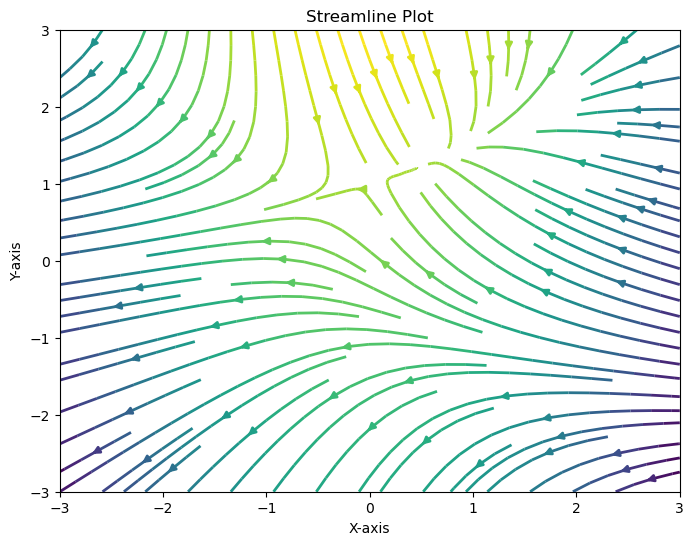

In [141]:
import numpy as np
import matplotlib.pyplot as plt

# Generate vector field data
Y, X = np.mgrid[-3:3:100j, -3:3:100j]
U = -1 - X**2 + Y
V = 1 + X - Y**2

# Create streamline plot
plt.figure(figsize=(8, 6))
plt.streamplot(X, Y, U, V, color=U, linewidth=2, cmap='viridis')

plt.title('Streamline Plot')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.show()

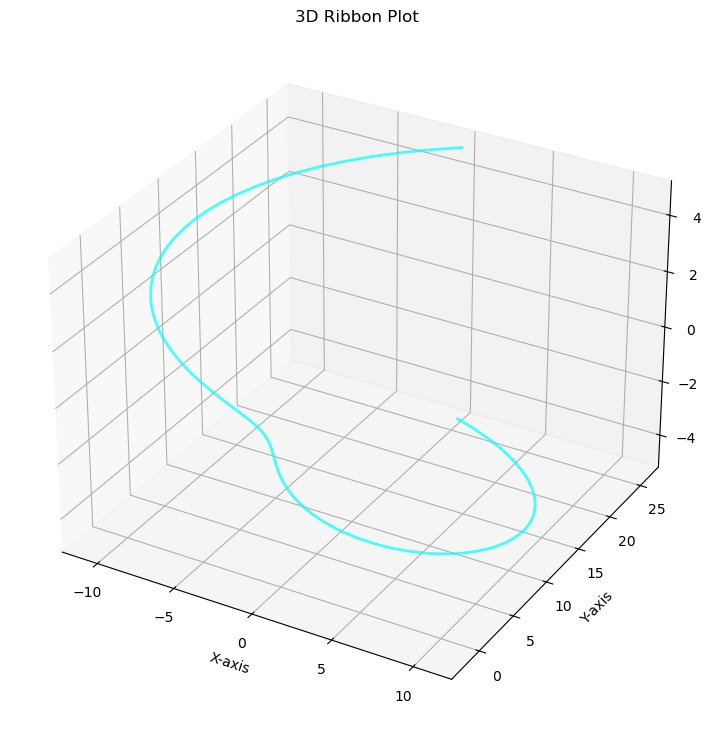

In [143]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Generate data
theta = np.linspace(0, 2*np.pi, 100)
z = np.linspace(-5, 5, 100)
r = z**2 + 1
x = r * np.sin(theta)
y = r * np.cos(theta)

# Create 3D ribbon plot
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')
ax.plot(x, y, z, color='cyan', alpha=0.7, linewidth=2)

# Labels and title
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
ax.set_title('3D Ribbon Plot')

plt.show()

In [145]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from scipy import stats
from matplotlib.ticker import MaxNLocator
from ternary import TernaryAxes

# Example data for ternary plot
data = np.random.rand(100, 3)
data /= data.sum(axis=1)[:, None]  # Normalize to sum to 1

# Create a ternary plot
fig, ax = plt.subplots(figsize=(8, 8))
ax = fig.add_subplot(111, projection='ternary')
ax.scatter(data[:, 0], data[:, 1], data[:, 2], color=cm.viridis(np.random.rand(100)))

ax.set_title("Ternary Plot Example")
plt.show()

ModuleNotFoundError: No module named 'ternary'

In [147]:
pip install python-ternary

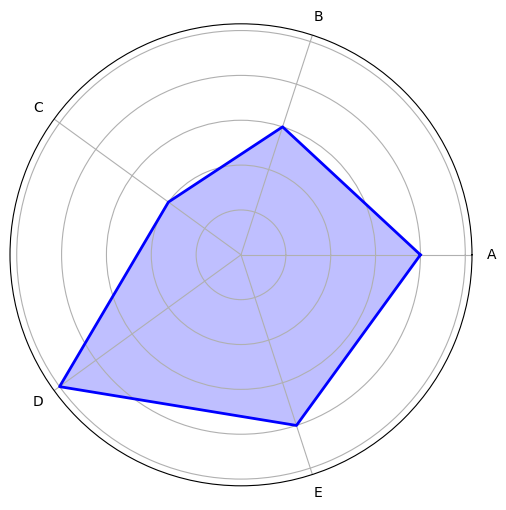

In [152]:
import matplotlib.pyplot as plt
import numpy as np

categories = ['A', 'B', 'C', 'D', 'E']
values = [4, 3, 2, 5, 4]

N = len(categories)
angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
values += values[:1]
angles += angles[:1]

fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.fill(angles, values, color='blue', alpha=0.25)
ax.plot(angles, values, color='blue', linewidth=2) 

ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
plt.show()

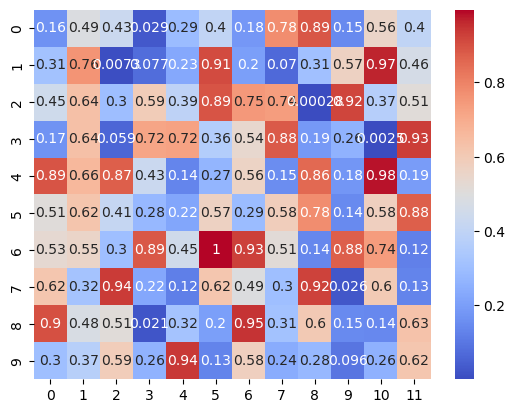

In [154]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

data = np.random.rand(10, 12)
sns.heatmap(data, cmap='coolwarm', annot=True)
plt.show()

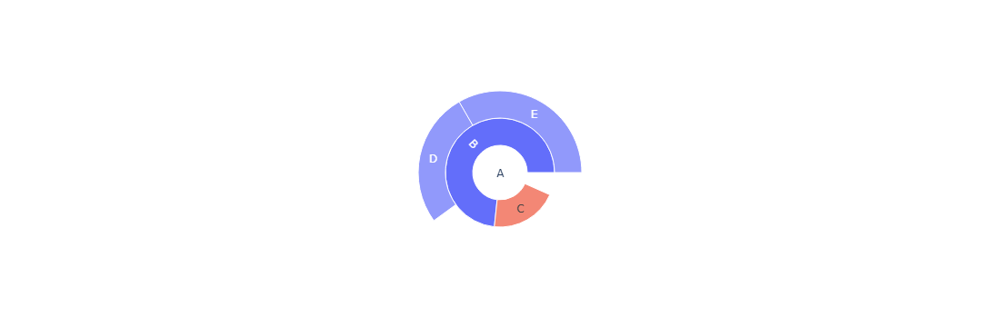

In [156]:
import plotly.graph_objects as go

fig = go.Figure(go.Sunburst(
    labels=["A", "B", "C", "D", "E"],
    parents=["", "A", "A", "B", "B"],
    values=[10, 20, 30, 40, 50]
))

fig.show()

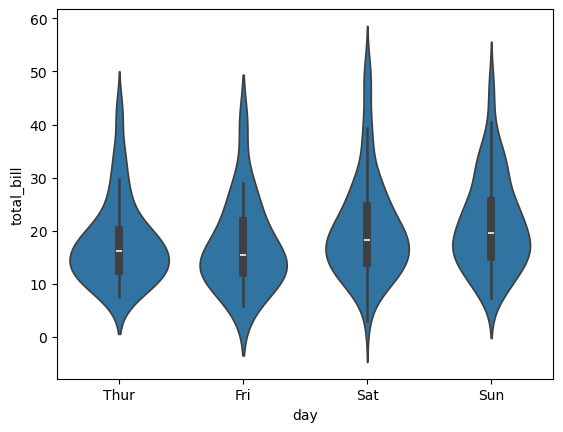

In [159]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example data
tips = sns.load_dataset("tips")
sns.violinplot(x="day", y="total_bill", data=tips)
plt.show()

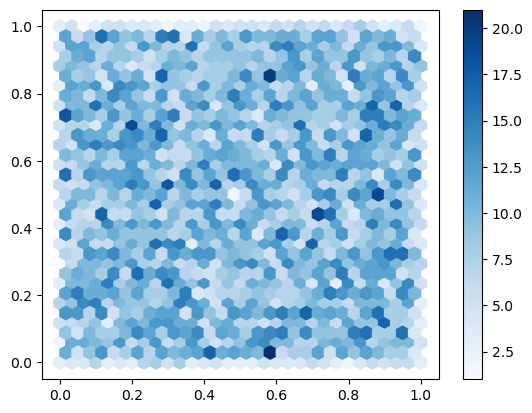

In [161]:
import matplotlib.pyplot as plt
import numpy as np

x = np.random.rand(10000)
y = np.random.rand(10000)

plt.hexbin(x, y, gridsize=30, cmap='Blues')
plt.colorbar()
plt.show()

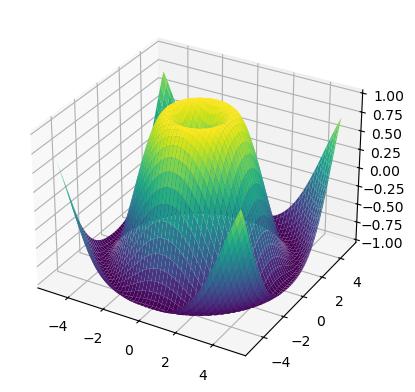

In [163]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
x, y = np.meshgrid(x, y)
z = np.sin(np.sqrt(x**2 + y**2))

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x, y, z, cmap='viridis')
plt.show()

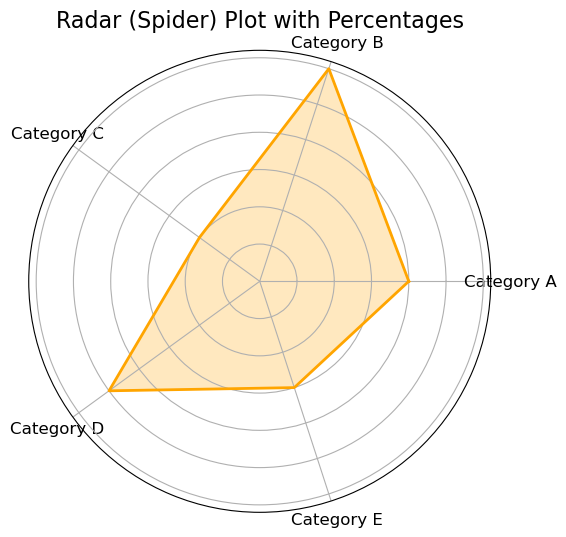

In [165]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the radar plot (percentages)
categories = ['Category A', 'Category B', 'Category C', 'Category D', 'Category E']
percentages = [20, 30, 10, 25, 15]

# Number of variables
N = len(categories)

# Compute angle for each category
angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()

# Make the radar plot a closed loop
percentages += percentages[:1]
angles += angles[:1]

# Create the plot
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.fill(angles, percentages, color='orange', alpha=0.25)  # Fill the area
ax.plot(angles, percentages, color='orange', linewidth=2)  # Outline the plot

# Add labels and title
ax.set_yticklabels([])  # Remove y-axis labels (percentages)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=12)

# Show the plot
plt.title("Radar (Spider) Plot with Percentages", fontsize=16)
plt.show()

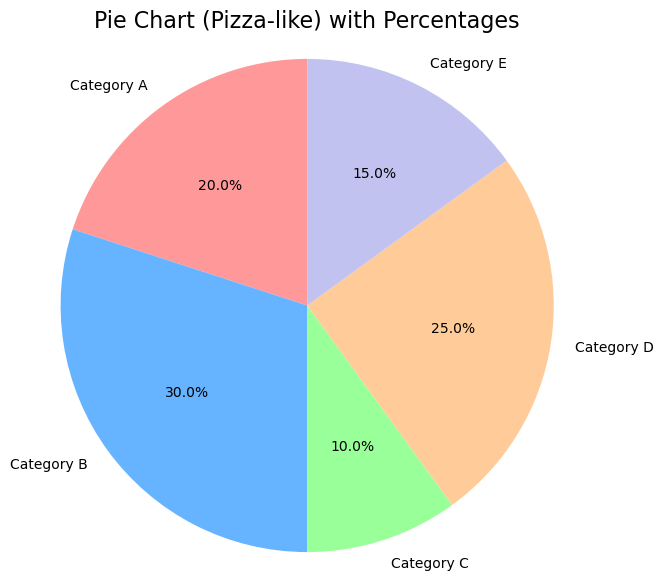

In [167]:
import matplotlib.pyplot as plt

# Data for the pie chart
categories = ['Category A', 'Category B', 'Category C', 'Category D', 'Category E']
percentages = [20, 30, 10, 25, 15]

# Create the pie chart
fig, ax = plt.subplots(figsize=(7, 7))
ax.pie(percentages, labels=categories, autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0'])

# Equal aspect ratio ensures that pie is drawn as a circle.
ax.axis('equal')  
plt.title("Pie Chart (Pizza-like) with Percentages", fontsize=16)
plt.show()

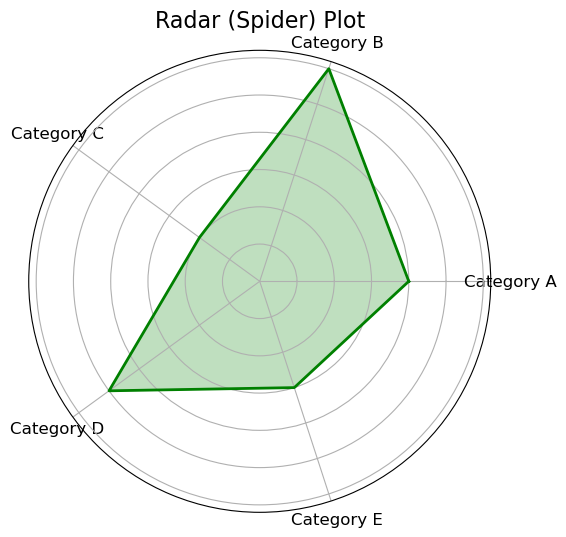

In [169]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the radar plot
categories = ['Category A', 'Category B', 'Category C', 'Category D', 'Category E']
values = [20, 30, 10, 25, 15]

# Number of variables
N = len(categories)

# Compute the angle for each category
angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()

# Make the radar plot a closed loop
values += values[:1]
angles += angles[:1]

# Create the plot
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.fill(angles, values, color='green', alpha=0.25)  # Fill the area
ax.plot(angles, values, color='green', linewidth=2)  # Outline the plot

# Add labels
ax.set_yticklabels([])  # Remove y-axis labels
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=12)

# Show the plot
plt.title("Radar (Spider) Plot", fontsize=16)
plt.show()

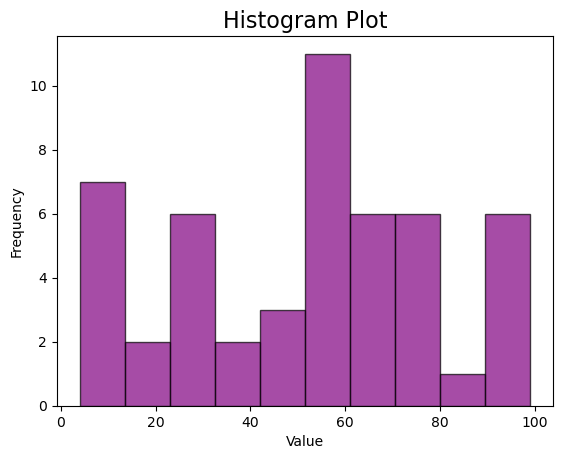

In [171]:
import matplotlib.pyplot as plt
import numpy as np

# Generating random data (for example: exam scores or age distribution)
data = np.random.randint(1, 100, 50)

# Create the histogram
plt.hist(data, bins=10, color='purple', edgecolor='black', alpha=0.7)

# Add labels
plt.title('Histogram Plot', fontsize=16)
plt.xlabel('Value')
plt.ylabel('Frequency')

# Show the plot
plt.show()

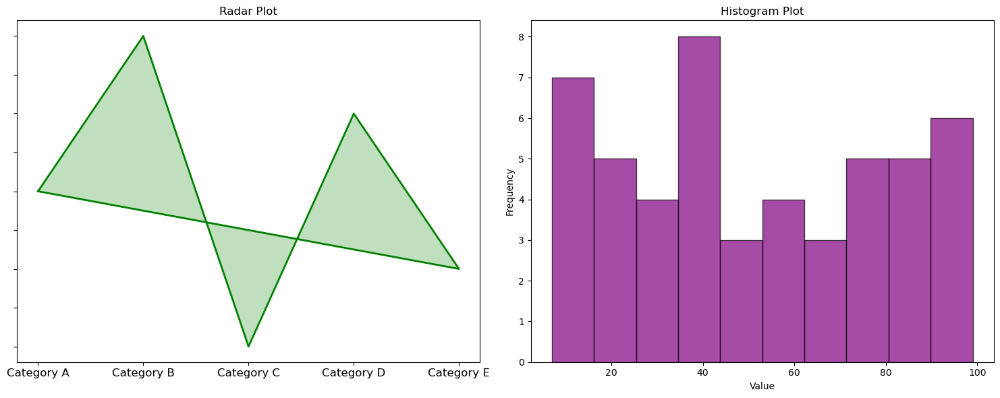

In [173]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the radar plot
categories = ['Category A', 'Category B', 'Category C', 'Category D', 'Category E']
values = [20, 30, 10, 25, 15]

# Histogram Data (random)
data = np.random.randint(1, 100, 50)

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Radar Plot
N = len(categories)
angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
values += values[:1]
angles += angles[:1]

ax1 = axs[0]
ax1.fill(angles, values, color='green', alpha=0.25)
ax1.plot(angles, values, color='green', linewidth=2)
ax1.set_yticklabels([])
ax1.set_xticks(angles[:-1])
ax1.set_xticklabels(categories, fontsize=12)
ax1.set_title('Radar Plot')

# Histogram Plot
ax2 = axs[1]
ax2.hist(data, bins=10, color='purple', edgecolor='black', alpha=0.7)
ax2.set_title('Histogram Plot')
ax2.set_xlabel('Value')
ax2.set_ylabel('Frequency')

# Show the plots
plt.tight_layout()
plt.show()

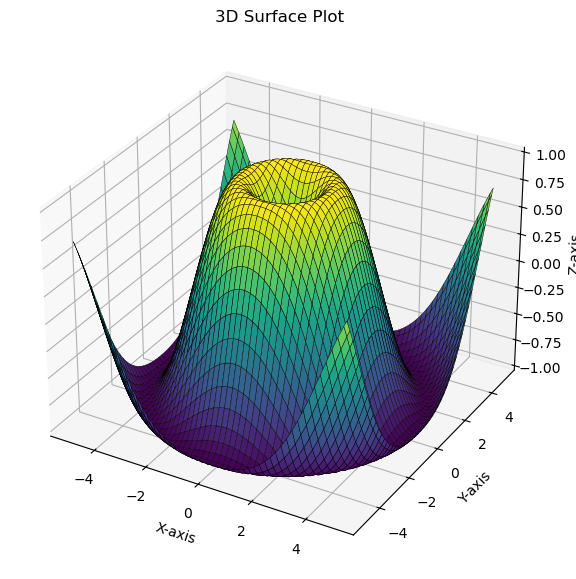

In [175]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Data: Create a meshgrid
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
x, y = np.meshgrid(x, y)

# Define a function for Z (e.g., a 3D sine wave)
z = np.sin(np.sqrt(x**2 + y**2))

# Create the plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(x, y, z, cmap='viridis', edgecolor='k', linewidth=0.3)

# Labels and title
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
ax.set_title('3D Surface Plot')

# Show the plot
plt.show()

C:\Users\user\anaconda3\Lib\site-packages\ternary\plotting.py:148: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



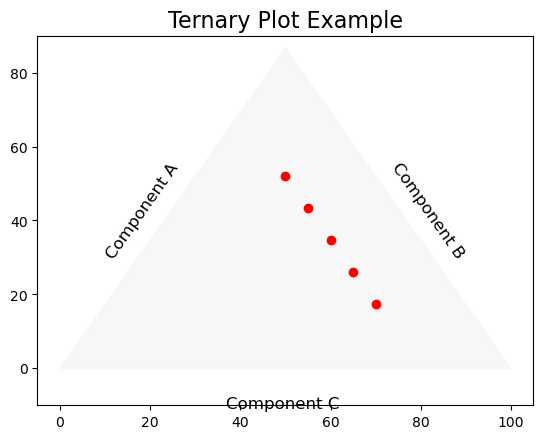

In [177]:
import ternary
import numpy as np
import matplotlib.pyplot as plt

# Create a figure for the ternary plot
figure, tax = ternary.figure(scale=100)

# Example data: Points in ternary coordinates
points = [(60, 20, 20), (50, 30, 20), (40, 40, 20), (30, 50, 20), (20, 60, 20)]
tax.scatter(points, marker='o', color='red', label="Sample Points")

# Annotate the plot with labels
tax.set_title("Ternary Plot Example", fontsize=16)
tax.left_axis_label("Component A", fontsize=12)
tax.right_axis_label("Component B", fontsize=12)
tax.bottom_axis_label("Component C", fontsize=12)

# Display the plot
tax.show()

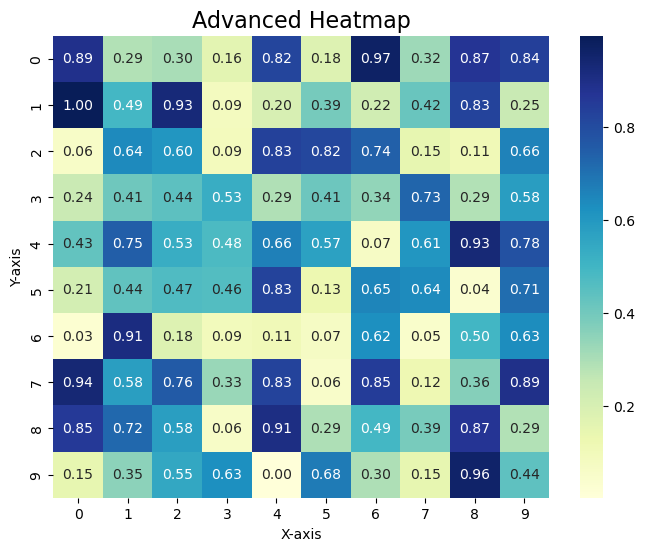

In [179]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Create random data for the heatmap
data = np.random.rand(10, 10)

# Create the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(data, annot=True, cmap='YlGnBu', fmt='.2f', cbar=True)

# Add labels and title
plt.title("Advanced Heatmap", fontsize=16)
plt.xlabel('X-axis')
plt.ylabel('Y-axis')

# Show the plot
plt.show()

In [181]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Create a simple world map
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Example: Plot the world with country boundaries
fig, ax = plt.subplots(figsize=(12, 8))
world.plot(ax=ax, color='lightblue', edgecolor='black')

# Add a title
ax.set_title("World Map", fontsize=16)

# Show the map
plt.show()

ModuleNotFoundError: No module named 'geopandas'

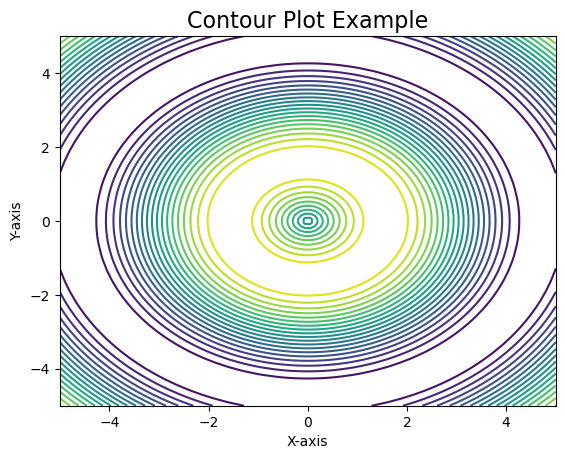

In [183]:
import numpy as np
import matplotlib.pyplot as plt

# Create data: a sine wave function
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)
Z = np.sin(np.sqrt(X**2 + Y**2))

# Create the contour plot
plt.contour(X, Y, Z, levels=20, cmap='viridis')

# Labels and title
plt.title("Contour Plot Example", fontsize=16)
plt.xlabel('X-axis')
plt.ylabel('Y-axis')

# Show the plot
plt.show()

In [185]:
pip install geopandas


   ---------------------------------------- 0.0/16.2 MB ? eta -:--:--
   ---------------------------------------- 0.0/16.2 MB ? eta -:--:--
    --------------------------------------- 0.3/16.2 MB ? eta -:--:--
   - -------------------------------------- 0.5/16.2 MB 1.2 MB/s eta 0:00:14
   - -------------------------------------- 0.8/16.2 MB 1.2 MB/s eta 0:00:13
   -- ------------------------------------- 1.0/16.2 MB 1.2 MB/s eta 0:00:13
   --- ------------------------------------ 1.6/16.2 MB 1.2 MB/s eta 0:00:13
   ---- ----------------------------------- 1.8/16.2 MB 1.2 MB/s eta 0:00:12
   ----- ---------------------------------- 2.1/16.2 MB 1.2 MB/s eta 0:00:12
   ----- ---------------------------------- 2.4/16.2 MB 1.2 MB/s eta 0:00:12
   ------ --------------------------------- 2.6/16.2 MB 1.2 MB/s eta 0:00:11
   ------- -------------------------------- 2.9/16.2 MB 1.2 MB/s eta 0:00:11
   ------- -------------------------------- 3.1/16.2 MB 1.2 MB/s eta 0:00:11
   -------- -------

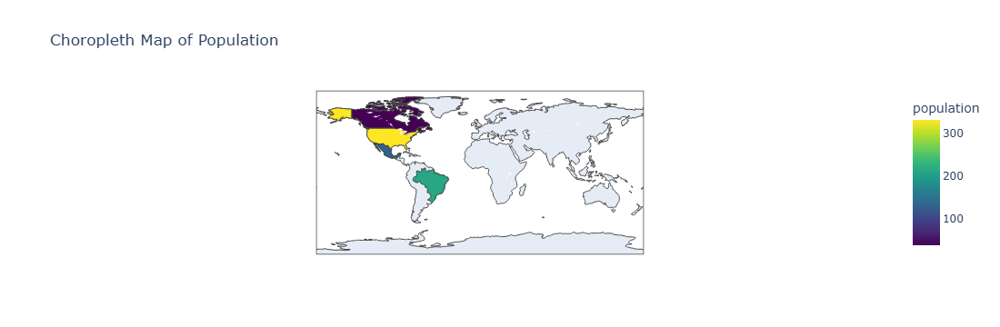

In [191]:
import plotly.express as px

# Create a simple choropleth map with Plotly
# Example data: population by country
data = {
    'country': ['USA', 'Canada', 'Mexico', 'Brazil', 'Argentina,Albania,Russia,Greece,China'],
    'population': [331, 38, 126, 213, 45],
}

df = pd.DataFrame(data)

# Plot the choropleth map
fig = px.choropleth(df, 
                    locations='country', 
                    locationmode='country names', 
                    color='population',
                    color_continuous_scale='Viridis',
                    title="Choropleth Map of Population")

fig.show()